## Introduction

In [11]:
! pip install git+https://github.com/facebookresearch/iopath@8f359cf63bec091969ad8f30fa14c17d3218c347#egg=iopath 

  Cloning https://github.com/facebookresearch/iopath (to revision 8f359cf63bec091969ad8f30fa14c17d3218c347) to c:\users\kihoon\appdata\local\temp\pip-install-u0hi1ilo\iopath_a4224cd0d9b6406db49af4a7f21d29cd
  Resolved https://github.com/facebookresearch/iopath to commit 8f359cf63bec091969ad8f30fa14c17d3218c347
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached portalocker-2.7.0-py2.py3-none-any.whl (15 kB)
  Created wheel for iopath: filename=iopath-0.1.8-py3-none-any.whl size=19906 sha256=d7bc74ffe67a66aeefe5688a01fbbc80a1a79d7eb5421ee35db9dfdad8d56331
  Stored in directory: c:\users\kihoon\appdata\local\pip\cache\wheels\62\b5\da\6d0f15c449b7a33b6399fb4bba92e2f0e1ef180d0929ed085a
Successfully built iopath


  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/iopath 'C:\Users\kihoon\AppData\Local\Temp\pip-install-u0hi1ilo\iopath_a4224cd0d9b6406db49af4a7f21d29cd'
  Running command git rev-parse -q --verify 'sha^8f359cf63bec091969ad8f30fa14c17d3218c347'
  Running command git fetch -q https://github.com/facebookresearch/iopath 8f359cf63bec091969ad8f30fa14c17d3218c347
  Running command git checkout -q 8f359cf63bec091969ad8f30fa14c17d3218c347


In [12]:
! python -m pip install git+https://github.com/facebookresearch/detectron2.git

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [3]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

## Run a Pre-trained Detectron2 Model

In [6]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
# outputs = predictor(image)

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


## COCO Format Dataset

### Download

- `COCO Segmentation` format.


```
dataset-directory/
├─ README.dataset.txt
├─ README.roboflow.txt
├─ train
│  ├─ train-image-1.jpg
│  ├─ train-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
├─ test
│  ├─ test-image-1.jpg
│  ├─ test-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
└─ valid
   ├─ valid-image-1.jpg
   ├─ valid-image-1.jpg
   ├─ ...
   └─ _annotations.coco.json
```

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="sK7KyNXL8rhhfnM3B78q")
project = rf.workspace("teknofest23").project("wrinkle-segmentation-5iaty")
dataset = project.version(1).download("coco-segmentation")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.2 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=5741809bb3407f4bd5111cf6404c990b6c1c4cd962128235516743143f3143e8
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: idna
    Found e

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Wrinkle-Segmentation-1 in coco-segmentation:: 100%|██████████| 354/354 [00:00<00:00, 2247.95it/s]


### Register

When you use Detectron2, before you actually train the model you need to [register it](https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html#register-a-coco-format-dataset).

In [25]:
DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"

In [26]:
# TRAIN SET
TRAIN_DATA_SET_NAME = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TRAIN_DATA_SET_NAME,
    metadata={},
    json_file=TRAIN_DATA_SET_ANN_FILE_PATH,
    image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
)

# TEST SET
# TEST_DATA_SET_NAME = f"{DATA_SET_NAME}-test"
# TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
# TEST_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

# register_coco_instances(
#     name=TEST_DATA_SET_NAME,
#     metadata={},
#     json_file=TEST_DATA_SET_ANN_FILE_PATH,
#     image_root=TEST_DATA_SET_IMAGES_DIR_PATH
# )

# VALID SET
VALID_DATA_SET_NAME = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=VALID_DATA_SET_NAME,
    metadata={},
    json_file=VALID_DATA_SET_ANN_FILE_PATH,
    image_root=VALID_DATA_SET_IMAGES_DIR_PATH
)

AssertionError: ignored

In [17]:
VALID_DATA_SET_ANN_FILE_PATH,VALID_DATA_SET_IMAGES_DIR_PATH,VALID_DATA_SET_NAME

('/content/Wrinkle-Segmentation-1/train/_annotations.coco.json',
 '/content/Wrinkle-Segmentation-1/train',
 'Wrinkle-Segmentation-valid')

We can now confirm that our custom dataset was correctly registered using [MetadataCatalog](https://detectron2.readthedocs.io/en/latest/modules/data.html#detectron2.data.MetadataCatalog).

In [10]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['Wrinkle-Segmentation-train', 'Wrinkle-Segmentation-valid']

### Visualize

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



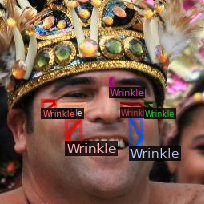

In [11]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
dataset_train = DatasetCatalog.get(TRAIN_DATA_SET_NAME)

dataset_entry = dataset_train[0]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata,
    scale=0.8,
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

## Train Model Using Custom COCO Format Dataset

### Configuration

In [12]:
# HYPERPARAMETERS
ARCHITECTURE = "mask_rcnn_R_101_FPN_3x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 2000
EVAL_PERIOD = 200
BASE_LR = 0.001
NUM_CLASSES = 3

# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DATA_SET_NAME,
    ARCHITECTURE,
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [27]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (TRAIN_DATA_SET_NAME,)
cfg.DATASETS.TEST = ()
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

### Training

In [28]:
import os
os.environ['DETECTRON2_DATASETS'] = "/content/Wrinkle-Segmentation-1"

In [29]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/10 09:54:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[08/10 09:54:27 d2.engine.train_loop]: Starting training from iteration 0
[08/10 09:54:37 d2.utils.events]:  eta: 0:17:03  iter: 19  total_loss: 6.368  loss_cls: 1.339  loss_box_reg: 0.01402  loss_mask: 0.6924  loss_rpn_cls: 4.004  loss_rpn_loc: 0.3798    time: 0.4886  last_time: 0.5871  data_time: 0.0234  last_data_time: 0.0232   lr: 1.9981e-05  max_mem: 3320M
[08/10 09:54:47 d2.utils.events]:  eta: 0:15:33  iter: 39  total_loss: 3.248  loss_cls: 0.9873  loss_box_reg: 0.3084  loss_mask: 0.6657  loss_rpn_cls: 0.9303  loss_rpn_loc: 0.2771    time: 0.4843  last_time: 0.5443  data_time: 0.0154  last_data_time: 0.0209   lr: 3.9961e-05  max_mem: 3320M
[08/10 09:54:57 d2.utils.events]:  eta: 0:15:18  iter: 59  total_loss: 2.528  loss_cls: 0.7673  loss_box_reg: 0.5106  loss_mask: 0.6302  loss_rpn_cls: 0.3238  loss_rpn_loc: 0.3178    time: 0.4949  last_time: 0.4621  data_time: 0.0198  last_data_time: 0.0087   lr: 5.9941e-05  max_mem: 3320M
[08/10 09:55:07 d2.utils.events]:  eta: 0:15:14  iter:

In [30]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

### Evaluation

In [31]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[08/10 10:13:47 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/2023-08-10-09-21-30/model_final.pth ...


WARNING [08/10 10:24:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/10 10:24:17 d2.data.datasets.coco]: Loaded 350 images in COCO format from /content/Wrinkle-Segmentation-1/train/_annotations.coco.json


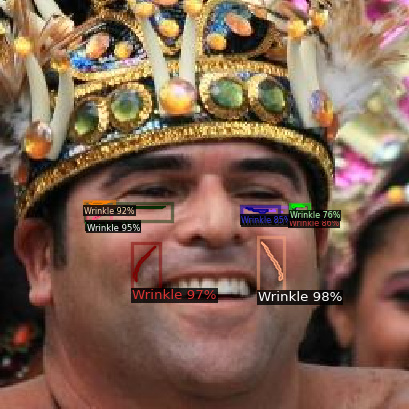

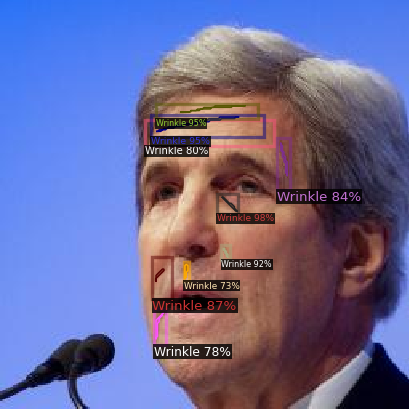

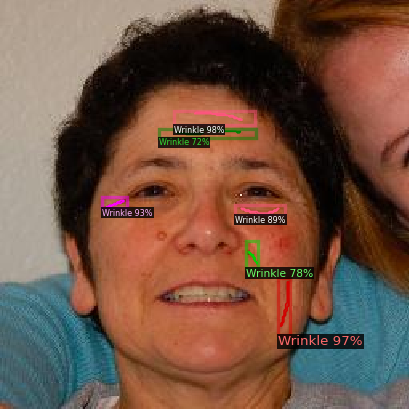

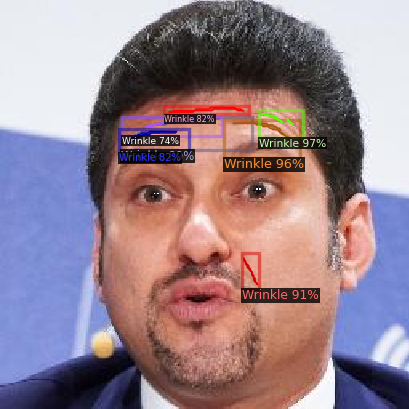

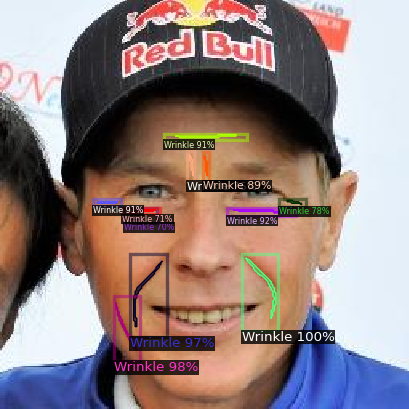

...

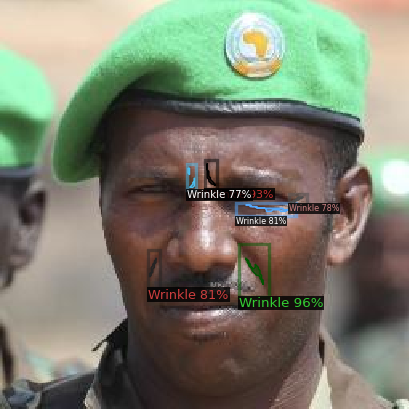

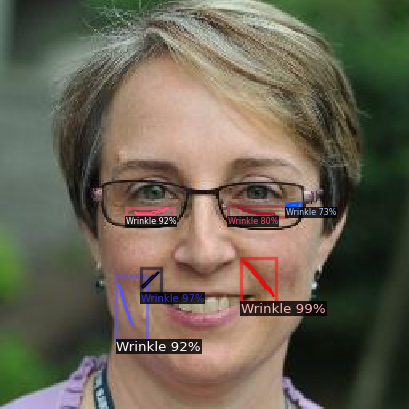

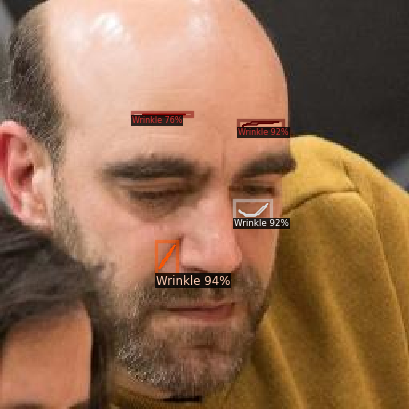

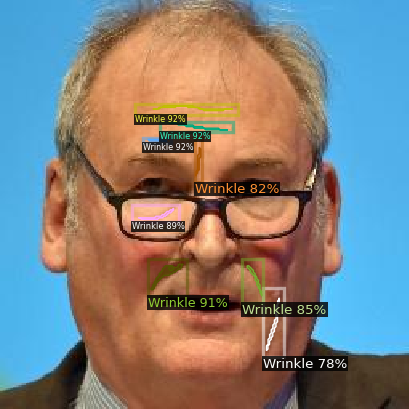

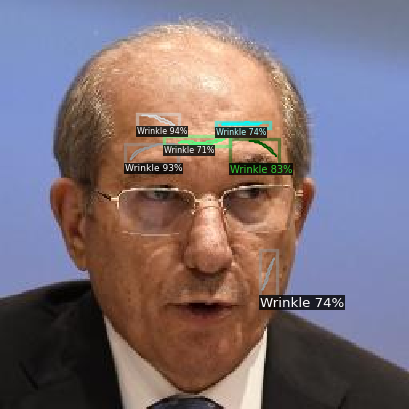

KeyboardInterrupt: ignored

In [56]:
dataset_valid = DatasetCatalog.get(VALID_DATA_SET_NAME)

for d in dataset_valid:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    visualizer = Visualizer(
        img[:, :, ::-1],
        metadata=metadata,
        scale=1.6,
        instance_mode=ColorMode.SEGMENTATION
    )
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [33]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [48]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [53]:
! zip -r ./winkle.zip /content/Wrinkle-Segmentation

  adding: content/Wrinkle-Segmentation/ (stored 0%)
  adding: content/Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/ (stored 0%)
  adding: content/Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/2023-08-10-09-21-30/ (stored 0%)
  adding: content/Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/2023-08-10-09-21-30/model_final.pth (deflated 7%)
  adding: content/Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/2023-08-10-09-21-30/events.out.tfevents.1691659808.77e515531617.319.1 (deflated 69%)
  adding: content/Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/2023-08-10-09-21-30/events.out.tfevents.1691659317.77e515531617.319.0 (deflated 69%)
  adding: content/Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/2023-08-10-09-21-30/events.out.tfevents.1691661277.77e515531617.319.2 (deflated 73%)
  adding: content/Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/2023-08-10-09-21-30/last_checkpoint (stored 0%)
  adding: content/Wrinkle-Segmentation/mask_rcnn_R_101_FPN_3x/2023-08-10-09-21-30/metrics.json (deflated 80%)


In [54]:
!cp winkle.zip drive/MyDrive/

# Show  Image

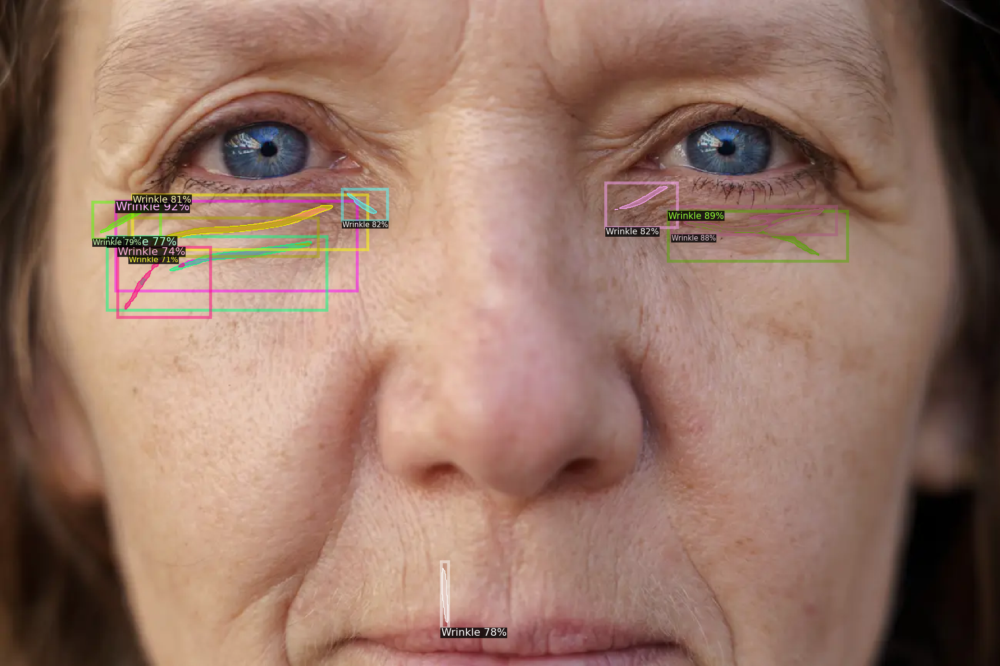

In [69]:
img = cv2.imread('./face.webp')
outputs = predictor(img)

visualizer = Visualizer(
    img[:, :, ::-1],
    metadata=metadata,
    scale=1.6,
    instance_mode=ColorMode.SEGMENTATION
)
out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [61]:
outputs

{'instances': Instances(num_instances=0, image_height=3088, image_width=2316, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64), pred_masks: tensor([], device='cuda:0', size=(0, 3088, 2316), dtype=torch.bool)])}